
# Triangle-Area Histograms for the 20260324 NPH Comparison

This notebook compares the triangle-area distributions from the nine simulation families below:

- `results/20260309_NPH_batch_xyz_saving` -> `NPH`
- `results/20260313_NPH_batch_xyz_saving_piston` -> `NPH piston`
- `results/20260313_NVT_batch_xyz_saving` -> `NVT`
- `results/20260323_NPH_batch_xyz_saving_all_type0` -> `NPH unary`
- `results/20260323_NPH_batch_xyz_saving_piston_all_type0` -> `NPH piston unary`
- `results/20260323_NVT_batch_xyz_saving_all_type0` -> `NVT unary`
- `results/20260324_NPH_batch_xyz_saving` -> `NPH fast`
- `results/20260324_NPH_batch_xyz_saving_piston` -> `NPH piston fast`
- `results/20260324_NVT_batch_xyz_saving` -> `NVT fast`

For each simulation and temperature, it:

1. Streams the raw XYZ frames and the matching `.tri2d` triangulation file in lockstep.
2. Keeps only second-phase frames.
3. Splits the triangle areas into three groups: total, mixed (`AAB` + `ABB`), and pure (`AAA` + `BBB`).
4. Computes one triangle-area histogram per frame for each group.
5. Averages those frame histograms to get one mean histogram per simulation.
6. Reuses any already-saved histogram CSV that matches the shared binning and the required columns for that temperature.
7. Computes and saves missing histogram CSVs when needed.
8. Plots the results in two views for each temperature: a 3x3 subplot grid and one overlaid comparison plot.
9. Writes both the original PDF-style plots and matching `log10(probability)` copies.

If a requested run is missing its `.tri2d` file, the notebook reports that in the availability table and keeps the corresponding subplot empty.


In [6]:

import math
import os
import re
import struct
from functools import lru_cache
from itertools import zip_longest
from pathlib import Path

os.environ.setdefault("MPLBACKEND", "Agg")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.lines import Line2D


def find_repo_root(start: Path | None = None) -> Path:
    start = start or Path.cwd()
    for candidate in (start, *start.parents):
        if (candidate / "python" / "particle_csv.py").exists():
            return candidate
    raise RuntimeError("Could not locate the repo root containing python/particle_csv.py")


REPO_ROOT = find_repo_root()
ANALYSIS_ROOT = REPO_ROOT / "results" / "analysis_NPH_20260324_triangle_area"
CSV_DIR = ANALYSIS_ROOT / "csv"
PLOTS_SEPARATE_DIR = ANALYSIS_ROOT / "plots_separate"
PLOTS_OVERLAY_DIR = ANALYSIS_ROOT / "plots_overlay"

for path in (ANALYSIS_ROOT, CSV_DIR, PLOTS_SEPARATE_DIR, PLOTS_OVERLAY_DIR):
    path.mkdir(parents=True, exist_ok=True)

N_BINS = 120
BIN_PADDING_FRACTION = 0.03
FORCE_RECOMPUTE = False
FIG_DPI = 150

HISTOGRAM_GROUP_SPECS = [
    {"id": "total", "label": "total"},
    {
        "id": "mixed",
        "label": "mixed (AAB/ABB)",
        "short_label": "mixed",
        "color": "#d95f02",
        "linestyle": "-",
    },
    {
        "id": "pure",
        "label": "pure (AAA/BBB)",
        "short_label": "pure",
        "color": "#1b9e77",
        "linestyle": "--",
    },
]
HISTOGRAM_GROUP_IDS = [spec["id"] for spec in HISTOGRAM_GROUP_SPECS]
HISTOGRAM_GROUP_SPEC_BY_ID = {spec["id"]: spec for spec in HISTOGRAM_GROUP_SPECS}
PER_TYPE_GROUP_IDS = ("mixed", "pure")
PLOT_METRIC_IDS = ("pdf", "log_probability")

plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams["figure.dpi"] = FIG_DPI
plt.rcParams["savefig.dpi"] = FIG_DPI
plt.rcParams["savefig.bbox"] = "tight"

RESULT_SPECS = [
    {
        "id": "nph",
        "label": "NPH",
        "cache_id": "nph_20260309",
        "root": REPO_ROOT / "results" / "20260309_NPH_batch_xyz_saving",
        "trajectory_name": "trajectory.xyz",
        "second_phase": "NPH",
        "color": "#1f77b4",
        "linestyle": "-",
    },
    {
        "id": "nph_piston",
        "label": "NPH piston",
        "cache_id": "nph_piston_20260313",
        "root": REPO_ROOT / "results" / "20260313_NPH_batch_xyz_saving_piston",
        "trajectory_name": "trajectory_piston.xyz",
        "second_phase": "NPH_PISTON",
        "color": "#d62728",
        "linestyle": "-",
    },
    {
        "id": "nvt",
        "label": "NVT",
        "cache_id": "nvt_20260313",
        "root": REPO_ROOT / "results" / "20260313_NVT_batch_xyz_saving",
        "trajectory_name": "trajectory_nvt.xyz",
        "second_phase": "NVT_500",
        "color": "#2ca02c",
        "linestyle": "-",
    },
    {
        "id": "nph_unary",
        "label": "NPH unary",
        "cache_id": "nph_all_type0_20260323",
        "root": REPO_ROOT / "results" / "20260323_NPH_batch_xyz_saving_all_type0",
        "trajectory_name": "trajectory.xyz",
        "second_phase": "NPH",
        "color": "#17becf",
        "linestyle": "--",
    },
    {
        "id": "nph_piston_unary",
        "label": "NPH piston unary",
        "cache_id": "nph_piston_all_type0_20260323",
        "root": REPO_ROOT / "results" / "20260323_NPH_batch_xyz_saving_piston_all_type0",
        "trajectory_name": "trajectory_piston.xyz",
        "second_phase": "NPH_PISTON",
        "color": "#ff7f0e",
        "linestyle": "--",
    },
    {
        "id": "nvt_unary",
        "label": "NVT unary",
        "cache_id": "nvt_all_type0_20260323",
        "root": REPO_ROOT / "results" / "20260323_NVT_batch_xyz_saving_all_type0",
        "trajectory_name": "trajectory_nvt.xyz",
        "second_phase": "NVT_500",
        "color": "#8c564b",
        "linestyle": "--",
    },
    {
        "id": "nph_fast",
        "label": "NPH fast",
        "cache_id": "nph_fast_20260324",
        "root": REPO_ROOT / "results" / "20260324_NPH_batch_xyz_saving",
        "trajectory_name": "trajectory.xyz",
        "second_phase": "NPH",
        "color": "#4e79a7",
        "linestyle": ":",
    },
    {
        "id": "nph_piston_fast",
        "label": "NPH piston fast",
        "cache_id": "nph_piston_fast_20260324",
        "root": REPO_ROOT / "results" / "20260324_NPH_batch_xyz_saving_piston",
        "trajectory_name": "trajectory_piston.xyz",
        "second_phase": "NPH_PISTON",
        "color": "#e15759",
        "linestyle": ":",
    },
    {
        "id": "nvt_fast",
        "label": "NVT fast",
        "cache_id": "nvt_fast_20260324",
        "root": REPO_ROOT / "results" / "20260324_NVT_batch_xyz_saving",
        "trajectory_name": "trajectory_nvt.xyz",
        "second_phase": "NVT_500",
        "color": "#59a14f",
        "linestyle": ":",
    },
]

SPEC_BY_ID = {spec["id"]: spec for spec in RESULT_SPECS}
SPEC_ORDER = {spec["id"]: idx for idx, spec in enumerate(RESULT_SPECS)}

print(f"Repo root: {REPO_ROOT}")
print(f"Histogram CSVs will be written under: {CSV_DIR}")
print(f"Separated plots will be written under: {PLOTS_SEPARATE_DIR}")
print(f"Overlay plots will be written under: {PLOTS_OVERLAY_DIR}")


Repo root: /nfs/roberts/scratch/pi_co54/bh692/MD_Simulation_CUDA
Histogram CSVs will be written under: /nfs/roberts/scratch/pi_co54/bh692/MD_Simulation_CUDA/results/analysis_NPH_20260324_triangle_area/csv
Separated plots will be written under: /nfs/roberts/scratch/pi_co54/bh692/MD_Simulation_CUDA/results/analysis_NPH_20260324_triangle_area/plots_separate
Overlay plots will be written under: /nfs/roberts/scratch/pi_co54/bh692/MD_Simulation_CUDA/results/analysis_NPH_20260324_triangle_area/plots_overlay


In [7]:

TEMP_PATTERN = re.compile(r"^T=(?P<value>[-+]?\d*\.?\d+)$")

TRI2D_MAGIC = b"TRI2D01\0"
FRAME_MAGIC = 0x314D5246

UINT32 = struct.Struct("<I")
UINT64 = struct.Struct("<Q")
INT64 = struct.Struct("<q")
FLOAT64 = struct.Struct("<d")
UINT8 = struct.Struct("<B")

XYZ_TAG_TO_TYPE = {"A": 0, "B": 1}


def parse_temperature_dir_name(path: Path) -> float:
    match = TEMP_PATTERN.match(path.name)
    if not match:
        raise ValueError(f"Temperature directory must look like T=<value>, got {path.name!r}")
    return float(match.group("value"))


def safe_temp_label(temp_value: float) -> str:
    return f"{temp_value:.1f}".replace(".", "p")


def list_temperature_dirs(spec: dict) -> dict[float, Path]:
    mapping: dict[float, Path] = {}
    for temp_dir in sorted(spec["root"].glob("T=*")):
        if temp_dir.is_dir():
            mapping[parse_temperature_dir_name(temp_dir)] = temp_dir
    return mapping


def collect_temperature_values(specs: list[dict]) -> list[float]:
    values: set[float] = set()
    for spec in specs:
        values.update(list_temperature_dirs(spec).keys())
    return sorted(values)


def resolve_temperature_dir(spec: dict, temp_value: float) -> Path | None:
    temp_dir = spec["root"] / f"T={temp_value:.1f}"
    if temp_dir.is_dir():
        return temp_dir
    return None


def resolve_triangulation_path(spec: dict, temp_dir: Path) -> Path:
    return temp_dir / f"{spec['trajectory_name']}.tri2d"


def parse_metadata_line(line: str) -> dict[str, object]:
    parsed: dict[str, object] = {}
    for token in line.strip().split():
        key, value = token.split("=", 1)
        if key == "phase":
            parsed[key] = value
        elif key in {"global_step", "phase_step"}:
            parsed[key] = int(value)
        else:
            parsed[key] = float(value)
    return parsed


def read_exact(handle, n_bytes: int) -> bytes:
    data = handle.read(n_bytes)
    if len(data) != n_bytes:
        raise RuntimeError(f"Unexpected end of file while trying to read {n_bytes} bytes")
    return data


def read_scalar(handle, fmt: struct.Struct):
    return fmt.unpack(read_exact(handle, fmt.size))[0]


def read_string(handle) -> str:
    length = read_scalar(handle, UINT32)
    return read_exact(handle, length).decode("utf-8")


def parse_particle_type(tag: str) -> int:
    if tag not in XYZ_TAG_TO_TYPE:
        raise RuntimeError(f"Unexpected particle tag {tag!r} in XYZ data")
    return XYZ_TAG_TO_TYPE[tag]


def iter_xyz_frames(path: Path):
    with path.open("r", encoding="utf-8") as handle:
        frame_index = 0
        while True:
            header = handle.readline()
            if not header:
                return

            header = header.strip()
            if not header:
                continue

            n_particles = int(header)
            metadata_line = handle.readline()
            if metadata_line == "":
                raise RuntimeError(f"Unexpected end of file after XYZ header in {path}")
            metadata = parse_metadata_line(metadata_line)

            positions = np.empty((n_particles, 2), dtype=np.float64)
            particle_types = np.empty(n_particles, dtype=np.int8)
            for idx in range(n_particles):
                particle_line = handle.readline()
                if particle_line == "":
                    raise RuntimeError(f"Unexpected end of file inside particle block for {path}")
                tag, x_str, y_str, _ = particle_line.split()
                positions[idx, 0] = float(x_str)
                positions[idx, 1] = float(y_str)
                particle_types[idx] = parse_particle_type(tag)

            yield {
                "frame_index": frame_index,
                "n_particles": n_particles,
                "phase": metadata["phase"],
                "global_step": metadata["global_step"],
                "phase_step": metadata["phase_step"],
                "global_time": metadata["global_time"],
                "phase_time": metadata["phase_time"],
                "Lx": metadata["Lx"],
                "Ly": metadata["Ly"],
                "positions": positions,
                "particle_types": particle_types,
            }
            frame_index += 1


def iter_tri2d_frames(path: Path):
    with path.open("rb") as handle:
        file_magic = read_exact(handle, len(TRI2D_MAGIC))
        if file_magic != TRI2D_MAGIC:
            raise RuntimeError(f"Unexpected tri2d magic in {path}: {file_magic!r}")

        version = read_scalar(handle, UINT32)
        if version != 2:
            raise RuntimeError(f"Unsupported tri2d version in {path}: {version}")

        n_frames = read_scalar(handle, UINT64)
        backend_code = read_scalar(handle, UINT8)
        pbc_band_min_box_fraction = read_scalar(handle, FLOAT64)
        xyz_source = read_string(handle)
        output_source = read_string(handle)

        for _ in range(n_frames):
            frame_magic = read_scalar(handle, UINT32)
            if frame_magic != FRAME_MAGIC:
                raise RuntimeError(f"Unexpected frame magic in {path}: {frame_magic}")

            frame_index = read_scalar(handle, UINT64)
            n_particles = read_scalar(handle, UINT64)
            n_vertices = read_scalar(handle, UINT64)
            n_triangles = read_scalar(handle, UINT64)
            pbc_band_width = read_scalar(handle, FLOAT64)
            lx = read_scalar(handle, FLOAT64)
            ly = read_scalar(handle, FLOAT64)
            global_step = read_scalar(handle, INT64)
            phase_step = read_scalar(handle, INT64)
            global_time = read_scalar(handle, FLOAT64)
            phase_time = read_scalar(handle, FLOAT64)
            phase = read_string(handle)
            comment = read_string(handle)

            particle_indices = np.frombuffer(read_exact(handle, n_vertices * 4), dtype="<i4").copy()
            shift_x = np.frombuffer(read_exact(handle, n_vertices), dtype=np.int8).copy()
            shift_y = np.frombuffer(read_exact(handle, n_vertices), dtype=np.int8).copy()
            triangles = np.frombuffer(read_exact(handle, n_triangles * 3 * 4), dtype="<i4").reshape(-1, 3).copy()

            yield {
                "frame_index": int(frame_index),
                "n_particles": int(n_particles),
                "n_vertices": int(n_vertices),
                "n_triangles": int(n_triangles),
                "backend_code": int(backend_code),
                "pbc_band_min_box_fraction": float(pbc_band_min_box_fraction),
                "pbc_band_width": float(pbc_band_width),
                "xyz_source": xyz_source,
                "output_source": output_source,
                "Lx": float(lx),
                "Ly": float(ly),
                "global_step": int(global_step),
                "phase_step": int(phase_step),
                "global_time": float(global_time),
                "phase_time": float(phase_time),
                "phase": phase,
                "comment": comment,
                "particle_indices": particle_indices,
                "shift_x": shift_x,
                "shift_y": shift_y,
                "triangles": triangles,
            }


def iter_second_phase_triangle_areas(spec: dict, temp_dir: Path):
    xyz_path = temp_dir / spec["trajectory_name"]
    tri_path = resolve_triangulation_path(spec, temp_dir)

    xyz_iter = iter_xyz_frames(xyz_path)
    tri_iter = iter_tri2d_frames(tri_path)

    for pair_index, (xyz_frame, tri_frame) in enumerate(zip_longest(xyz_iter, tri_iter), start=1):
        if xyz_frame is None or tri_frame is None:
            raise RuntimeError(f"XYZ/tri2d frame count mismatch for {temp_dir}")

        if int(xyz_frame["n_particles"]) != int(tri_frame["n_particles"]):
            raise RuntimeError(f"Particle-count mismatch at paired frame {pair_index} for {temp_dir}")

        if (
            xyz_frame["phase"] != tri_frame["phase"]
            or int(xyz_frame["global_step"]) != int(tri_frame["global_step"])
            or int(xyz_frame["phase_step"]) != int(tri_frame["phase_step"])
        ):
            raise RuntimeError(
                f"XYZ/tri2d metadata mismatch at paired frame {pair_index} for {temp_dir}: "
                f"XYZ phase={xyz_frame['phase']} global_step={xyz_frame['global_step']} phase_step={xyz_frame['phase_step']} vs "
                f"TRI phase={tri_frame['phase']} global_step={tri_frame['global_step']} phase_step={tri_frame['phase_step']}"
            )

        if xyz_frame["phase"] != spec["second_phase"]:
            continue

        positions = xyz_frame["positions"]
        particle_types = xyz_frame["particle_types"]
        n_vertices = int(tri_frame["n_vertices"])
        shifts = np.empty((n_vertices, 2), dtype=np.float64)
        shifts[:, 0] = tri_frame["shift_x"].astype(np.float64) * float(tri_frame["Lx"])
        shifts[:, 1] = tri_frame["shift_y"].astype(np.float64) * float(tri_frame["Ly"])
        vertices = positions[tri_frame["particle_indices"]] + shifts
        vertex_particle_types = particle_types[tri_frame["particle_indices"]]

        triangle_vertices = vertices[tri_frame["triangles"]]
        cross = (
            (triangle_vertices[:, 1, 0] - triangle_vertices[:, 0, 0])
            * (triangle_vertices[:, 2, 1] - triangle_vertices[:, 0, 1])
            - (triangle_vertices[:, 1, 1] - triangle_vertices[:, 0, 1])
            * (triangle_vertices[:, 2, 0] - triangle_vertices[:, 0, 0])
        )
        areas = 0.5 * np.abs(cross)

        triangle_type_counts = np.sum(vertex_particle_types[tri_frame["triangles"]] == 0, axis=1)
        mixed_mask = (triangle_type_counts == 1) | (triangle_type_counts == 2)
        pure_mask = (triangle_type_counts == 0) | (triangle_type_counts == 3)

        yield {
            "frame_index": int(xyz_frame["frame_index"]),
            "global_step": int(xyz_frame["global_step"]),
            "phase_step": int(xyz_frame["phase_step"]),
            "global_time": float(xyz_frame["global_time"]),
            "phase_time": float(xyz_frame["phase_time"]),
            "Lx": float(xyz_frame["Lx"]),
            "Ly": float(xyz_frame["Ly"]),
            "areas_by_group": {
                "total": areas,
                "mixed": areas[mixed_mask],
                "pure": areas[pure_mask],
            },
        }


In [8]:

def mean_count_column(group_id: str) -> str:
    return f"mean_count_per_frame_{group_id}"


def mean_probability_column(group_id: str) -> str:
    return f"mean_probability_{group_id}"


def mean_density_column(group_id: str) -> str:
    return f"mean_density_{group_id}"


def mean_triangles_column(group_id: str) -> str:
    return f"mean_triangles_per_frame_{group_id}"


def histogram_required_columns() -> list[str]:
    columns = [
        "temperature",
        "simulation_id",
        "simulation_label",
        "second_phase",
        "bin_index",
        "bin_left",
        "bin_right",
        "bin_center",
        "bin_width",
        "n_frames",
        "first_phase_time",
        "last_phase_time",
    ]
    for group_id in HISTOGRAM_GROUP_IDS:
        columns.extend(
            [
                mean_count_column(group_id),
                mean_probability_column(group_id),
                mean_density_column(group_id),
                mean_triangles_column(group_id),
            ]
        )
    return columns


def histogram_csv_path(spec: dict, temp_value: float) -> Path:
    return CSV_DIR / f"triangle_area_histogram_{spec['cache_id']}_T_{safe_temp_label(temp_value)}.csv"


@lru_cache(maxsize=None)
def read_histogram_csv_columns(csv_path_str: str) -> tuple[str, ...]:
    csv_path = Path(csv_path_str)
    if not csv_path.exists():
        return tuple()

    with csv_path.open("r", encoding="utf-8") as handle:
        header = handle.readline().strip()
    if not header:
        return tuple()
    return tuple(part.strip() for part in header.split(","))


def histogram_df_to_bin_edges(df: pd.DataFrame) -> np.ndarray:
    if df.empty:
        raise RuntimeError("Histogram CSV is empty")

    bin_left = df["bin_left"].to_numpy(dtype=np.float64)
    bin_right = df["bin_right"].to_numpy(dtype=np.float64)
    return np.concatenate([bin_left, bin_right[-1:]])


def load_histogram_bin_edges(csv_path: Path) -> np.ndarray:
    df = pd.read_csv(csv_path, usecols=["bin_left", "bin_right"])
    return histogram_df_to_bin_edges(df)


def bin_edges_match(lhs: np.ndarray, rhs: np.ndarray) -> bool:
    return len(lhs) == len(rhs) and np.allclose(lhs, rhs)


def histogram_csv_has_bin_columns(csv_path: Path) -> bool:
    columns = set(read_histogram_csv_columns(str(csv_path.resolve())))
    return {"bin_left", "bin_right"}.issubset(columns)


def histogram_csv_has_required_columns(csv_path: Path) -> bool:
    columns = set(read_histogram_csv_columns(str(csv_path.resolve())))
    return set(histogram_required_columns()).issubset(columns)


def summarize_availability(specs: list[dict]) -> pd.DataFrame:
    rows: list[dict[str, object]] = []
    for spec in specs:
        for temp_value, temp_dir in list_temperature_dirs(spec).items():
            xyz_path = temp_dir / spec["trajectory_name"]
            tri_path = resolve_triangulation_path(spec, temp_dir)
            csv_path = histogram_csv_path(spec, temp_value)
            rows.append(
                {
                    "temperature": temp_value,
                    "simulation_id": spec["id"],
                    "simulation_label": spec["label"],
                    "second_phase": spec["second_phase"],
                    "temp_dir": str(temp_dir.relative_to(REPO_ROOT)),
                    "xyz_exists": xyz_path.exists(),
                    "tri2d_exists": tri_path.exists(),
                    "ready": xyz_path.exists() and tri_path.exists(),
                    "cached_csv_exists": csv_path.exists(),
                    "cached_csv_path": "" if not csv_path.exists() else str(csv_path.relative_to(REPO_ROOT)),
                }
            )

    availability_df = pd.DataFrame(rows)
    if availability_df.empty:
        return availability_df

    availability_df["simulation_order"] = availability_df["simulation_id"].map(SPEC_ORDER)
    availability_df = availability_df.sort_values(["temperature", "simulation_order"]).reset_index(drop=True)
    return availability_df.drop(columns="simulation_order")


def scan_area_range(spec: dict, temp_dir: Path) -> dict[str, float | int]:
    area_min: float | None = None
    area_max: float | None = None
    n_frames = 0
    total_triangles = 0

    for frame in iter_second_phase_triangle_areas(spec, temp_dir):
        areas = frame["areas_by_group"]["total"]
        if areas.size == 0:
            continue

        frame_min = float(np.min(areas))
        frame_max = float(np.max(areas))
        area_min = frame_min if area_min is None else min(area_min, frame_min)
        area_max = frame_max if area_max is None else max(area_max, frame_max)
        total_triangles += int(areas.size)
        n_frames += 1

    if n_frames == 0 or area_min is None or area_max is None:
        raise RuntimeError(f"No second-phase triangles were found for {spec['label']} at {temp_dir}")

    return {
        "area_min": float(area_min),
        "area_max": float(area_max),
        "n_frames": int(n_frames),
        "mean_triangles_per_frame": float(total_triangles) / float(n_frames),
    }


def build_bin_edges(range_summaries: list[dict[str, float | int]]) -> np.ndarray:
    area_min = min(float(summary["area_min"]) for summary in range_summaries)
    area_max = max(float(summary["area_max"]) for summary in range_summaries)

    if not np.isfinite(area_min) or not np.isfinite(area_max):
        raise RuntimeError("Histogram area range contains non-finite values")

    if area_max <= area_min:
        area_max = area_min + 1.0e-6

    span = area_max - area_min
    padded_min = max(0.0, area_min - BIN_PADDING_FRACTION * span)
    padded_max = area_max + BIN_PADDING_FRACTION * span
    if padded_max <= padded_min:
        padded_max = padded_min + 1.0e-6

    return np.linspace(padded_min, padded_max, N_BINS + 1, dtype=np.float64)


def csv_matches_bins(csv_path: Path, bin_edges: np.ndarray) -> bool:
    if not histogram_csv_has_required_columns(csv_path):
        return False

    csv_bin_edges = load_histogram_bin_edges(csv_path)
    return bin_edges_match(csv_bin_edges, bin_edges)


def load_histogram_summary(
    spec: dict,
    temp_value: float,
    csv_path: Path,
    *,
    source: str,
) -> dict[str, object]:
    df = pd.read_csv(csv_path)
    n_frames = int(df["n_frames"].iloc[0])
    mean_triangles_per_frame_by_group = {
        group_id: float(df[mean_triangles_column(group_id)].iloc[0]) for group_id in HISTOGRAM_GROUP_IDS
    }
    return {
        "spec": spec,
        "temperature": temp_value,
        "csv_path": csv_path,
        "n_frames": n_frames,
        "mean_triangles_per_frame": mean_triangles_per_frame_by_group["total"],
        "mean_triangles_per_frame_by_group": mean_triangles_per_frame_by_group,
        "dataframe": df,
        "source": source,
    }


def compute_and_save_mean_histogram(
    spec: dict,
    temp_value: float,
    temp_dir: Path,
    bin_edges: np.ndarray,
) -> dict[str, object]:
    sum_counts_by_group = {
        group_id: np.zeros(len(bin_edges) - 1, dtype=np.float64) for group_id in HISTOGRAM_GROUP_IDS
    }
    sum_probability_by_group = {
        group_id: np.zeros(len(bin_edges) - 1, dtype=np.float64) for group_id in HISTOGRAM_GROUP_IDS
    }

    n_frames = 0
    total_triangles_by_group = {group_id: 0 for group_id in HISTOGRAM_GROUP_IDS}
    first_phase_time: float | None = None
    last_phase_time: float | None = None

    for frame in iter_second_phase_triangle_areas(spec, temp_dir):
        areas_by_group = frame["areas_by_group"]
        total_areas = areas_by_group["total"]
        if total_areas.size == 0:
            continue

        total_counts, _ = np.histogram(total_areas, bins=bin_edges)
        if total_counts.sum() == 0:
            continue

        for group_id in HISTOGRAM_GROUP_IDS:
            counts, _ = np.histogram(areas_by_group[group_id], bins=bin_edges)
            sum_counts_by_group[group_id] += counts
            total_triangles_by_group[group_id] += int(counts.sum())
            if counts.sum() > 0:
                sum_probability_by_group[group_id] += counts / counts.sum()

        n_frames += 1

        if first_phase_time is None:
            first_phase_time = float(frame["phase_time"])
        last_phase_time = float(frame["phase_time"])

    if n_frames == 0:
        raise RuntimeError(f"No second-phase histogram data were accumulated for {spec['label']} at {temp_dir}")

    bin_width = np.diff(bin_edges)
    data: dict[str, object] = {
        "temperature": temp_value,
        "simulation_id": spec["id"],
        "simulation_label": spec["label"],
        "second_phase": spec["second_phase"],
        "bin_index": np.arange(len(bin_edges) - 1, dtype=np.int32),
        "bin_left": bin_edges[:-1],
        "bin_right": bin_edges[1:],
        "bin_center": 0.5 * (bin_edges[:-1] + bin_edges[1:]),
        "bin_width": bin_width,
        "n_frames": n_frames,
        "first_phase_time": np.nan if first_phase_time is None else first_phase_time,
        "last_phase_time": np.nan if last_phase_time is None else last_phase_time,
    }

    mean_triangles_per_frame_by_group: dict[str, float] = {}
    for group_id in HISTOGRAM_GROUP_IDS:
        mean_count_per_frame = sum_counts_by_group[group_id] / float(n_frames)
        mean_probability = sum_probability_by_group[group_id] / float(n_frames)
        mean_density = mean_probability / bin_width
        mean_triangles_per_frame = float(total_triangles_by_group[group_id]) / float(n_frames)

        data[mean_count_column(group_id)] = mean_count_per_frame
        data[mean_probability_column(group_id)] = mean_probability
        data[mean_density_column(group_id)] = mean_density
        data[mean_triangles_column(group_id)] = mean_triangles_per_frame
        mean_triangles_per_frame_by_group[group_id] = mean_triangles_per_frame

    df = pd.DataFrame(data)

    csv_path = histogram_csv_path(spec, temp_value)
    df.to_csv(csv_path, index=False)
    read_histogram_csv_columns.cache_clear()

    return {
        "spec": spec,
        "temperature": temp_value,
        "csv_path": csv_path,
        "n_frames": n_frames,
        "mean_triangles_per_frame": mean_triangles_per_frame_by_group["total"],
        "mean_triangles_per_frame_by_group": mean_triangles_per_frame_by_group,
        "dataframe": df,
        "source": "computed",
    }


def range_fits_bin_edges(range_summary: dict[str, float | int], bin_edges: np.ndarray) -> bool:
    tolerance = 1.0e-12
    return (
        float(range_summary["area_min"]) >= float(bin_edges[0]) - tolerance
        and float(range_summary["area_max"]) <= float(bin_edges[-1]) + tolerance
    )


def determine_bin_edges_for_temperature(
    temp_value: float,
    runs: list[dict[str, object]],
    *,
    force_recompute: bool = False,
) -> tuple[np.ndarray, dict[str, dict[str, float | int]], str]:
    if not force_recompute:
        cached_bin_edges: np.ndarray | None = None
        cached_bins_consistent = True

        for run in runs:
            spec = run["spec"]
            csv_path = histogram_csv_path(spec, temp_value)
            if not histogram_csv_has_bin_columns(csv_path):
                continue

            current_bin_edges = load_histogram_bin_edges(csv_path)
            if cached_bin_edges is None:
                cached_bin_edges = current_bin_edges
            elif not bin_edges_match(cached_bin_edges, current_bin_edges):
                cached_bins_consistent = False
                break

        if cached_bin_edges is not None and cached_bins_consistent:
            range_summaries: dict[str, dict[str, float | int]] = {}
            for run in runs:
                spec = run["spec"]
                csv_path = histogram_csv_path(spec, temp_value)
                if histogram_csv_has_bin_columns(csv_path):
                    continue

                range_summary = scan_area_range(spec, run["temp_dir"])
                range_summaries[spec["id"]] = range_summary
                if not range_fits_bin_edges(range_summary, cached_bin_edges):
                    break
            else:
                return cached_bin_edges, range_summaries, "cached_csv"

    range_summaries = {}
    for run in runs:
        spec = run["spec"]
        range_summaries[spec["id"]] = scan_area_range(spec, run["temp_dir"])

    bin_edges = build_bin_edges(list(range_summaries.values()))
    return bin_edges, range_summaries, "rescanned_raw_data"


def compute_or_load_mean_histogram(
    spec: dict,
    temp_value: float,
    temp_dir: Path,
    bin_edges: np.ndarray,
    *,
    force_recompute: bool = False,
) -> dict[str, object]:
    csv_path = histogram_csv_path(spec, temp_value)
    if (not force_recompute) and csv_matches_bins(csv_path, bin_edges):
        return load_histogram_summary(spec, temp_value, csv_path, source="cached")
    return compute_and_save_mean_histogram(spec, temp_value, temp_dir, bin_edges)


def analyze_temperature(
    temp_value: float,
    runs: list[dict[str, object]],
    *,
    force_recompute: bool = False,
) -> dict[str, object]:
    bin_edges, range_summaries, bin_source = determine_bin_edges_for_temperature(
        temp_value,
        runs,
        force_recompute=force_recompute,
    )

    histograms: list[dict[str, object]] = []
    for run in runs:
        spec = run["spec"]
        temp_dir = run["temp_dir"]
        histograms.append(
            compute_or_load_mean_histogram(
                spec,
                temp_value,
                temp_dir,
                bin_edges,
                force_recompute=force_recompute,
            )
        )

    histograms.sort(key=lambda item: SPEC_ORDER[item["spec"]["id"]])
    return {
        "bin_edges": bin_edges,
        "bin_source": bin_source,
        "range_summaries": range_summaries,
        "histograms": histograms,
    }


def metric_axis_label(metric_id: str) -> str:
    if metric_id == "pdf":
        return "mean density"
    if metric_id == "log_probability":
        return "log10 mean probability"
    raise ValueError(f"Unknown metric id {metric_id!r}")


def metric_title_label(metric_id: str) -> str:
    if metric_id == "pdf":
        return "PDF"
    if metric_id == "log_probability":
        return "log10 probability"
    raise ValueError(f"Unknown metric id {metric_id!r}")


def metric_filename_label(metric_id: str) -> str:
    if metric_id == "pdf":
        return "pdf"
    if metric_id == "log_probability":
        return "log_probability"
    raise ValueError(f"Unknown metric id {metric_id!r}")


def extract_metric_values(df: pd.DataFrame, group_id: str, metric_id: str) -> tuple[np.ndarray, np.ndarray]:
    x = df["bin_center"].to_numpy(dtype=np.float64)
    if metric_id == "pdf":
        y = df[mean_density_column(group_id)].to_numpy(dtype=np.float64)
        return x, y
    if metric_id == "log_probability":
        probability = df[mean_probability_column(group_id)].to_numpy(dtype=np.float64)
        y = np.full(probability.shape, np.nan, dtype=np.float64)
        positive_mask = probability > 0.0
        y[positive_mask] = np.log10(probability[positive_mask])
        return x, y
    raise ValueError(f"Unknown metric id {metric_id!r}")


def has_plottable_data(y: np.ndarray) -> bool:
    return bool(np.any(np.isfinite(y)))


def total_plot_stats_text(histogram: dict[str, object]) -> str:
    return chr(10).join(
        [
            f"n_frames={histogram['n_frames']}",
            f"mean Ntri={histogram['mean_triangles_per_frame_by_group']['total']:.0f}",
            histogram["source"],
        ]
    )


def type_plot_stats_text(histogram: dict[str, object]) -> str:
    by_group = histogram["mean_triangles_per_frame_by_group"]
    return chr(10).join(
        [
            f"mixed Ntri={by_group['mixed']:.0f}",
            f"pure Ntri={by_group['pure']:.0f}",
            histogram["source"],
        ]
    )


def total_separate_output_path(temp_value: float, metric_id: str) -> Path:
    if metric_id == "pdf":
        return PLOTS_SEPARATE_DIR / f"triangle_area_histograms_separate_T_{safe_temp_label(temp_value)}.svg"
    return PLOTS_SEPARATE_DIR / (
        f"triangle_area_histograms_separate_{metric_filename_label(metric_id)}_T_{safe_temp_label(temp_value)}.svg"
    )


def total_overlay_output_path(temp_value: float, metric_id: str) -> Path:
    if metric_id == "pdf":
        return PLOTS_OVERLAY_DIR / f"triangle_area_histograms_overlay_T_{safe_temp_label(temp_value)}.svg"
    return PLOTS_OVERLAY_DIR / (
        f"triangle_area_histograms_overlay_{metric_filename_label(metric_id)}_T_{safe_temp_label(temp_value)}.svg"
    )


def type_separate_output_path(temp_value: float, metric_id: str) -> Path:
    return PLOTS_SEPARATE_DIR / (
        f"triangle_area_histograms_by_type_separate_{metric_filename_label(metric_id)}_T_{safe_temp_label(temp_value)}.svg"
    )


def type_overlay_output_path(temp_value: float, metric_id: str) -> Path:
    return PLOTS_OVERLAY_DIR / (
        f"triangle_area_histograms_by_type_overlay_{metric_filename_label(metric_id)}_T_{safe_temp_label(temp_value)}.svg"
    )


def plot_total_histograms_by_simulation(temp_value: float, result: dict[str, object], metric_id: str) -> Path:
    histogram_by_id = {histogram["spec"]["id"]: histogram for histogram in result["histograms"]}

    fig, axes = plt.subplots(
        3,
        3,
        figsize=(15.0, 11.0),
        sharex=True,
        sharey=True,
        dpi=FIG_DPI,
    )
    axes = np.atleast_1d(axes).ravel()

    for ax, spec in zip(axes, RESULT_SPECS):
        histogram = histogram_by_id.get(spec["id"])

        ax.set_title(spec["label"])
        ax.set_xlabel("triangle area")
        ax.set_ylabel(metric_axis_label(metric_id))
        ax.grid(alpha=0.3)

        if histogram is None:
            ax.text(
                0.5,
                0.5,
                "missing xyz/tri2d",
                transform=ax.transAxes,
                ha="center",
                va="center",
                color="0.45",
                fontsize=11,
            )
            continue

        df = histogram["dataframe"]
        x, y = extract_metric_values(df, "total", metric_id)
        if has_plottable_data(y):
            ax.plot(
                x,
                y,
                color=spec["color"],
                linestyle=spec["linestyle"],
                linewidth=2.0,
            )
            if metric_id == "pdf":
                ax.fill_between(
                    x,
                    y,
                    color=spec["color"],
                    alpha=0.18,
                )
        else:
            ax.text(
                0.5,
                0.5,
                "no plottable data",
                transform=ax.transAxes,
                ha="center",
                va="center",
                color="0.45",
                fontsize=11,
            )

        ax.text(
            0.98,
            0.95,
            total_plot_stats_text(histogram),
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=9,
        )

    fig.suptitle(
        f"Second-phase total triangle-area {metric_title_label(metric_id)} by simulation (T={temp_value:g})",
        y=1.02,
    )
    fig.tight_layout()

    output_path = total_separate_output_path(temp_value, metric_id)
    fig.savefig(output_path, dpi=FIG_DPI)
    display(fig)
    plt.close(fig)
    return output_path


def plot_total_histograms_overlay(temp_value: float, result: dict[str, object], metric_id: str) -> Path | None:
    histograms = result["histograms"]
    if not histograms:
        return None

    histogram_by_id = {histogram["spec"]["id"]: histogram for histogram in histograms}
    fig, ax = plt.subplots(figsize=(10.2, 5.4), dpi=FIG_DPI)

    plotted_any = False
    for spec in RESULT_SPECS:
        histogram = histogram_by_id.get(spec["id"])
        if histogram is None:
            continue

        df = histogram["dataframe"]
        x, y = extract_metric_values(df, "total", metric_id)
        if not has_plottable_data(y):
            continue

        ax.plot(
            x,
            y,
            label=spec["label"],
            color=spec["color"],
            linestyle=spec["linestyle"],
            linewidth=2.0,
        )
        plotted_any = True

    ax.set_title(f"Second-phase total triangle-area {metric_title_label(metric_id)} comparison (T={temp_value:g})")
    ax.set_xlabel("triangle area")
    ax.set_ylabel(metric_axis_label(metric_id))
    ax.grid(alpha=0.3)
    if plotted_any:
        ax.legend(frameon=False, ncol=3)
    else:
        ax.text(0.5, 0.5, "No plottable data", ha="center", va="center", transform=ax.transAxes)

    output_path = total_overlay_output_path(temp_value, metric_id)
    fig.savefig(output_path, dpi=FIG_DPI)
    display(fig)
    plt.close(fig)
    return output_path


def plot_type_histograms_by_simulation(temp_value: float, result: dict[str, object], metric_id: str) -> Path:
    histogram_by_id = {histogram["spec"]["id"]: histogram for histogram in result["histograms"]}

    fig, axes = plt.subplots(
        3,
        3,
        figsize=(15.0, 11.0),
        sharex=True,
        sharey=True,
        dpi=FIG_DPI,
    )
    axes = np.atleast_1d(axes).ravel()

    legend_handles = [
        Line2D(
            [0],
            [0],
            color=HISTOGRAM_GROUP_SPEC_BY_ID[group_id]["color"],
            linestyle=HISTOGRAM_GROUP_SPEC_BY_ID[group_id]["linestyle"],
            linewidth=2.0,
            label=HISTOGRAM_GROUP_SPEC_BY_ID[group_id]["label"],
        )
        for group_id in PER_TYPE_GROUP_IDS
    ]

    for ax, spec in zip(axes, RESULT_SPECS):
        histogram = histogram_by_id.get(spec["id"])

        ax.set_title(spec["label"])
        ax.set_xlabel("triangle area")
        ax.set_ylabel(metric_axis_label(metric_id))
        ax.grid(alpha=0.3)

        if histogram is None:
            ax.text(
                0.5,
                0.5,
                "missing xyz/tri2d",
                transform=ax.transAxes,
                ha="center",
                va="center",
                color="0.45",
                fontsize=11,
            )
            continue

        df = histogram["dataframe"]
        plotted_any = False
        for group_id in PER_TYPE_GROUP_IDS:
            x, y = extract_metric_values(df, group_id, metric_id)
            if not has_plottable_data(y):
                continue
            group_spec = HISTOGRAM_GROUP_SPEC_BY_ID[group_id]
            ax.plot(
                x,
                y,
                color=group_spec["color"],
                linestyle=group_spec["linestyle"],
                linewidth=2.0,
            )
            plotted_any = True

        if not plotted_any:
            ax.text(
                0.5,
                0.5,
                "no mixed/pure data",
                transform=ax.transAxes,
                ha="center",
                va="center",
                color="0.45",
                fontsize=11,
            )

        ax.text(
            0.98,
            0.95,
            type_plot_stats_text(histogram),
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=9,
        )

    fig.legend(handles=legend_handles, frameon=False, ncol=2, loc="upper center", bbox_to_anchor=(0.5, 1.02))
    fig.suptitle(
        f"Second-phase mixed/pure triangle-area {metric_title_label(metric_id)} by simulation (T={temp_value:g})",
        y=1.08,
    )
    fig.tight_layout()

    output_path = type_separate_output_path(temp_value, metric_id)
    fig.savefig(output_path, dpi=FIG_DPI)
    display(fig)
    plt.close(fig)
    return output_path


def plot_type_histograms_overlay(temp_value: float, result: dict[str, object], metric_id: str) -> Path | None:
    histograms = result["histograms"]
    if not histograms:
        return None

    histogram_by_id = {histogram["spec"]["id"]: histogram for histogram in histograms}
    fig, axes = plt.subplots(1, 2, figsize=(13.2, 5.2), sharex=True, sharey=True, dpi=FIG_DPI)
    axes = np.atleast_1d(axes).ravel()

    for ax, group_id in zip(axes, PER_TYPE_GROUP_IDS):
        plotted_any = False
        for spec in RESULT_SPECS:
            histogram = histogram_by_id.get(spec["id"])
            if histogram is None:
                continue

            df = histogram["dataframe"]
            x, y = extract_metric_values(df, group_id, metric_id)
            if not has_plottable_data(y):
                continue

            ax.plot(
                x,
                y,
                label=spec["label"],
                color=spec["color"],
                linestyle=spec["linestyle"],
                linewidth=2.0,
            )
            plotted_any = True

        ax.set_title(HISTOGRAM_GROUP_SPEC_BY_ID[group_id]["label"])
        ax.set_xlabel("triangle area")
        ax.set_ylabel(metric_axis_label(metric_id))
        ax.grid(alpha=0.3)
        if not plotted_any:
            ax.text(0.5, 0.5, "No plottable data", ha="center", va="center", transform=ax.transAxes)

    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        fig.legend(handles, labels, frameon=False, ncol=3, loc="upper center", bbox_to_anchor=(0.5, 1.02))
    fig.suptitle(
        f"Second-phase mixed/pure triangle-area {metric_title_label(metric_id)} comparison (T={temp_value:g})",
        y=1.08,
    )
    fig.tight_layout()

    output_path = type_overlay_output_path(temp_value, metric_id)
    fig.savefig(output_path, dpi=FIG_DPI)
    display(fig)
    plt.close(fig)
    return output_path


In [9]:

availability_df = summarize_availability(RESULT_SPECS)
display(availability_df)

ordered_labels = [spec["label"] for spec in RESULT_SPECS]

if not availability_df.empty:
    readiness_pivot = availability_df.pivot(
        index="temperature",
        columns="simulation_label",
        values="ready",
    ).reindex(columns=ordered_labels)
    display(readiness_pivot)

    cache_pivot = availability_df.pivot(
        index="temperature",
        columns="simulation_label",
        values="cached_csv_exists",
    ).reindex(columns=ordered_labels)
    display(cache_pivot)

all_temperature_values = collect_temperature_values(RESULT_SPECS)
available_runs_by_temp: dict[float, list[dict[str, object]]] = {}

for temp_value in all_temperature_values:
    runs: list[dict[str, object]] = []
    for spec in RESULT_SPECS:
        temp_dir = resolve_temperature_dir(spec, temp_value)
        if temp_dir is None:
            continue

        xyz_path = temp_dir / spec["trajectory_name"]
        tri_path = resolve_triangulation_path(spec, temp_dir)
        if xyz_path.exists() and tri_path.exists():
            runs.append({"spec": spec, "temp_dir": temp_dir})

    if runs:
        available_runs_by_temp[temp_value] = runs

cache_counts_by_temp = (
    availability_df.groupby("temperature")["cached_csv_exists"].sum().astype(int).to_dict()
    if not availability_df.empty
    else {}
)

availability_summary_rows = [
    {
        "temperature": temp_value,
        "n_available_simulations": len(runs),
        "n_cached_csvs": int(cache_counts_by_temp.get(temp_value, 0)),
        "simulation_labels": ", ".join(run["spec"]["label"] for run in runs),
    }
    for temp_value, runs in available_runs_by_temp.items()
]
availability_summary_df = pd.DataFrame(availability_summary_rows)
if not availability_summary_df.empty:
    availability_summary_df = availability_summary_df.sort_values("temperature").reset_index(drop=True)
display(availability_summary_df)


,temperature,simulation_id,simulation_label,second_phase,temp_dir,xyz_exists,tri2d_exists,ready,cached_csv_exists,cached_csv_path
0,0.5,nph,NPH,NPH,results/20260309_NPH_batch_xyz_saving/T=0.5,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
1,0.5,nph_piston,NPH piston,NPH_PISTON,results/20260313_NPH_batch_xyz_saving_piston/T...,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
2,0.5,nvt,NVT,NVT_500,results/20260313_NVT_batch_xyz_saving/T=0.5,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
3,0.5,nph_unary,NPH unary,NPH,results/20260323_NPH_batch_xyz_saving_all_type...,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
4,0.5,nph_piston_unary,NPH piston unary,NPH_PISTON,results/20260323_NPH_batch_xyz_saving_piston_a...,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
5,0.5,nvt_unary,NVT unary,NVT_500,results/20260323_NVT_batch_xyz_saving_all_type...,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
6,0.5,nph_fast,NPH fast,NPH,results/20260324_NPH_batch_xyz_saving/T=0.5,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
7,0.5,nph_piston_fast,NPH piston fast,NPH_PISTON,results/20260324_NPH_batch_xyz_saving_piston/T...,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
8,0.5,nvt_fast,NVT fast,NVT_500,results/20260324_NVT_batch_xyz_saving/T=0.5,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...
9,0.6,nph,NPH,NPH,results/20260309_NPH_batch_xyz_saving/T=0.6,True,True,True,True,results/analysis_NPH_20260324_triangle_area/cs...


simulation_label,NPH,NPH piston,NVT,NPH unary,NPH piston unary,NVT unary,NPH fast,NPH piston fast,NVT fast
temperature,,,,,,,,,
0.5,True,True,True,True,True,True,True,True,True
0.6,True,True,True,True,True,True,True,True,True
0.7,True,True,True,True,True,True,True,True,True
0.8,True,True,True,True,True,True,True,True,True
0.9,True,True,True,True,True,True,True,True,True
1.0,True,True,True,True,True,True,True,True,True


simulation_label,NPH,NPH piston,NVT,NPH unary,NPH piston unary,NVT unary,NPH fast,NPH piston fast,NVT fast
temperature,,,,,,,,,
0.5,True,True,True,True,True,True,True,True,True
0.6,True,True,True,True,True,True,True,True,True
0.7,True,True,True,True,True,True,True,True,True
0.8,True,True,True,True,True,True,True,True,True
0.9,True,True,True,True,True,True,True,True,True
1.0,True,True,True,True,True,True,True,True,True


,temperature,n_available_simulations,n_cached_csvs,simulation_labels
0,0.5,9,9,"NPH, NPH piston, NVT, NPH unary, NPH piston un..."
1,0.6,9,9,"NPH, NPH piston, NVT, NPH unary, NPH piston un..."
2,0.7,9,9,"NPH, NPH piston, NVT, NPH unary, NPH piston un..."
3,0.8,9,9,"NPH, NPH piston, NVT, NPH unary, NPH piston un..."
4,0.9,9,9,"NPH, NPH piston, NVT, NPH unary, NPH piston un..."
5,1.0,9,9,"NPH, NPH piston, NVT, NPH unary, NPH piston un..."


In [10]:

analysis_by_temp: dict[float, dict[str, object]] = {}
loaded_csv_paths: set[Path] = set()
written_csv_paths: set[Path] = set()

for temp_value, runs in available_runs_by_temp.items():
    print(
        f"Processing T={temp_value:g} with {len(runs)}/{len(RESULT_SPECS)} simulation(s) that have triangulation data..."
    )
    analysis_result = analyze_temperature(
        temp_value,
        runs,
        force_recompute=FORCE_RECOMPUTE,
    )
    analysis_by_temp[temp_value] = analysis_result
    print(f"  histogram bin source: {analysis_result['bin_source']}")

    for histogram in analysis_result["histograms"]:
        if histogram["source"] == "cached":
            loaded_csv_paths.add(histogram["csv_path"])
        else:
            written_csv_paths.add(histogram["csv_path"])

analysis_summary_rows: list[dict[str, object]] = []
for temp_value, result in analysis_by_temp.items():
    bin_edges = result["bin_edges"]
    for histogram in result["histograms"]:
        by_group = histogram["mean_triangles_per_frame_by_group"]
        analysis_summary_rows.append(
            {
                "temperature": temp_value,
                "simulation_id": histogram["spec"]["id"],
                "simulation_label": histogram["spec"]["label"],
                "source": histogram["source"],
                "bin_source": result["bin_source"],
                "csv_path": str(histogram["csv_path"].relative_to(REPO_ROOT)),
                "n_frames": histogram["n_frames"],
                "mean_triangles_per_frame_total": by_group["total"],
                "mean_triangles_per_frame_mixed": by_group["mixed"],
                "mean_triangles_per_frame_pure": by_group["pure"],
                "bin_min": float(bin_edges[0]),
                "bin_max": float(bin_edges[-1]),
            }
        )

analysis_summary_df = pd.DataFrame(analysis_summary_rows)
if not analysis_summary_df.empty:
    analysis_summary_df["simulation_order"] = analysis_summary_df["simulation_id"].map(SPEC_ORDER)
    analysis_summary_df = (
        analysis_summary_df.sort_values(["temperature", "simulation_order"])
        .drop(columns="simulation_order")
        .reset_index(drop=True)
    )
display(analysis_summary_df)

print("Loaded histogram CSVs from cache:")
if loaded_csv_paths:
    for path in sorted(loaded_csv_paths, key=lambda item: str(item)):
        print(" -", path.relative_to(REPO_ROOT))
else:
    print(" - none")

print("Newly written histogram CSVs:")
if written_csv_paths:
    for path in sorted(written_csv_paths, key=lambda item: str(item)):
        print(" -", path.relative_to(REPO_ROOT))
else:
    print(" - none")


Processing T=0.5 with 9/9 simulation(s) that have triangulation data...


  histogram bin source: cached_csv
Processing T=0.6 with 9/9 simulation(s) that have triangulation data...
  histogram bin source: cached_csv
Processing T=0.7 with 9/9 simulation(s) that have triangulation data...
  histogram bin source: cached_csv
Processing T=0.8 with 9/9 simulation(s) that have triangulation data...
  histogram bin source: cached_csv
Processing T=0.9 with 9/9 simulation(s) that have triangulation data...
  histogram bin source: cached_csv
Processing T=1 with 9/9 simulation(s) that have triangulation data...
  histogram bin source: cached_csv


,temperature,simulation_id,simulation_label,source,bin_source,csv_path,n_frames,mean_triangles_per_frame_total,mean_triangles_per_frame_mixed,mean_triangles_per_frame_pure,bin_min,bin_max
0,0.5,nph,NPH,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33536.2288,341.5806,33194.6482,0.0,12.758550
1,0.5,nph_piston,NPH piston,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33478.3790,395.0240,33083.3550,0.0,12.758550
2,0.5,nvt,NVT,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33537.8964,330.2158,33207.6806,0.0,12.758550
3,0.5,nph_unary,NPH unary,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33536.7974,0.0000,33536.7974,0.0,12.758550
4,0.5,nph_piston_unary,NPH piston unary,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33471.3816,0.0000,33471.3816,0.0,12.758550
5,0.5,nvt_unary,NVT unary,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33536.0966,0.0000,33536.0966,0.0,12.758550
6,0.5,nph_fast,NPH fast,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33536.2750,359.0512,33177.2238,0.0,12.758550
7,0.5,nph_piston_fast,NPH piston fast,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33472.8996,335.2672,33137.6324,0.0,12.758550
8,0.5,nvt_fast,NVT fast,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33537.8964,330.2158,33207.6806,0.0,12.758550
9,0.6,nph,NPH,computed,cached_csv,results/analysis_NPH_20260324_triangle_area/cs...,5000,33537.1966,471.6886,33065.5080,0.0,7.846865


Loaded histogram CSVs from cache:
 - none
Newly written histogram CSVs:
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_20260309_T_0p5.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_20260309_T_0p6.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_20260309_T_0p7.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_20260309_T_0p8.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_20260309_T_0p9.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_20260309_T_1p0.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_all_type0_20260323_T_0p5.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_all_type0_20260323_T_0p6.csv
 - results/analysis_NPH_20260324_triangle_area/csv/triangle_area_histogram_nph_all_type0_20260323_T_0p7.csv
 - results/analy


## Plot Notes

- Each frame is histogrammed separately first, then those per-frame histograms are averaged over all second-phase frames.
- The notebook keeps three area groups in the cache: `total`, `mixed = AAB + ABB`, and `pure = AAA + BBB`.
- The PDF plots use the mean histogram density, so simulations at the same temperature are directly comparable.
- The log plots use `log10(mean probability)` and leave zero-probability bins blank.
- Cached histogram CSVs are reused whenever their bin edges and required by-type columns already match the shared binning for that temperature.
- If new runs extend the area range, the notebook rescans the raw data and rewrites any CSVs that need the updated shared bins.
- The separated view is always arranged as a 3x3 grid in the `RESULT_SPECS` order.


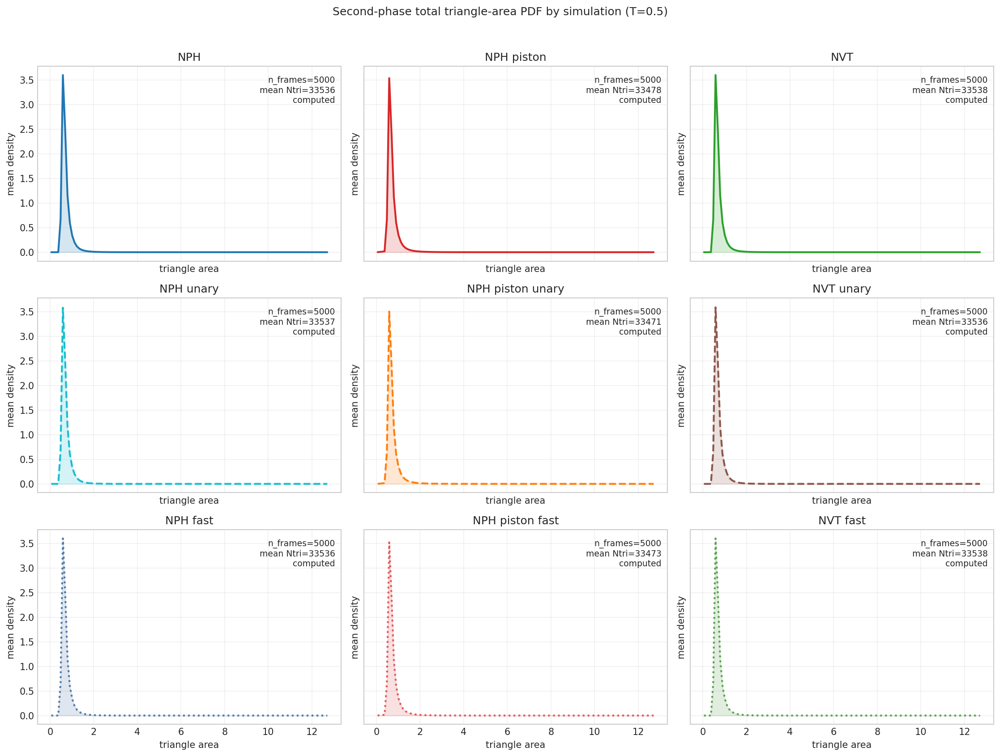

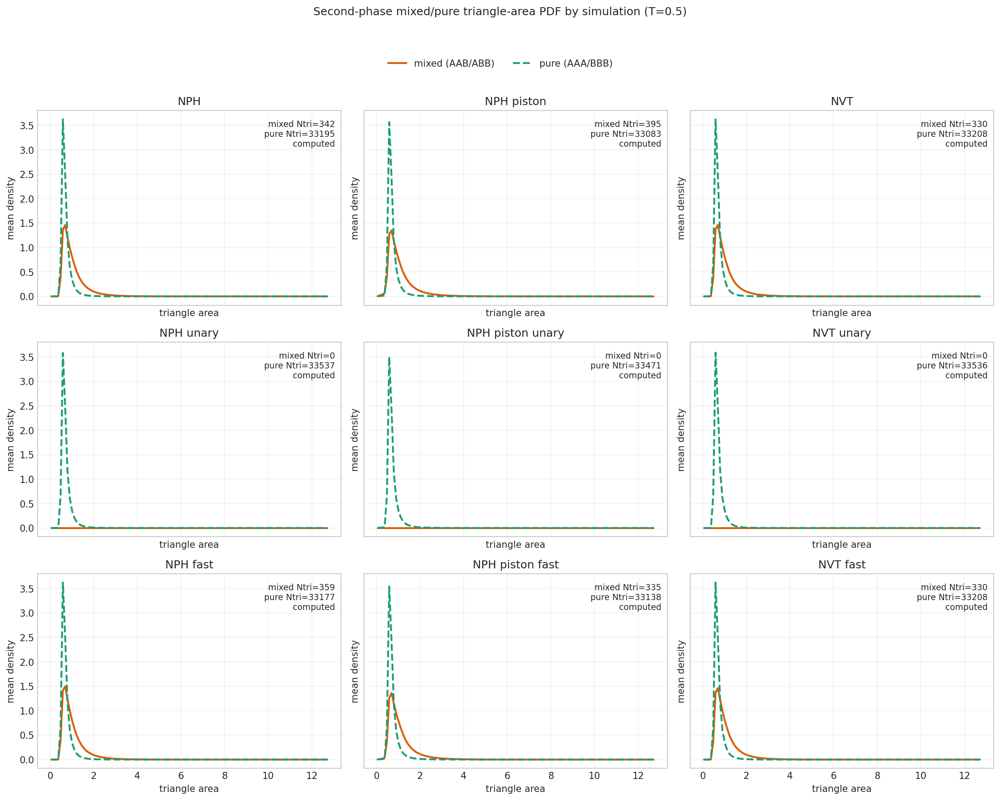

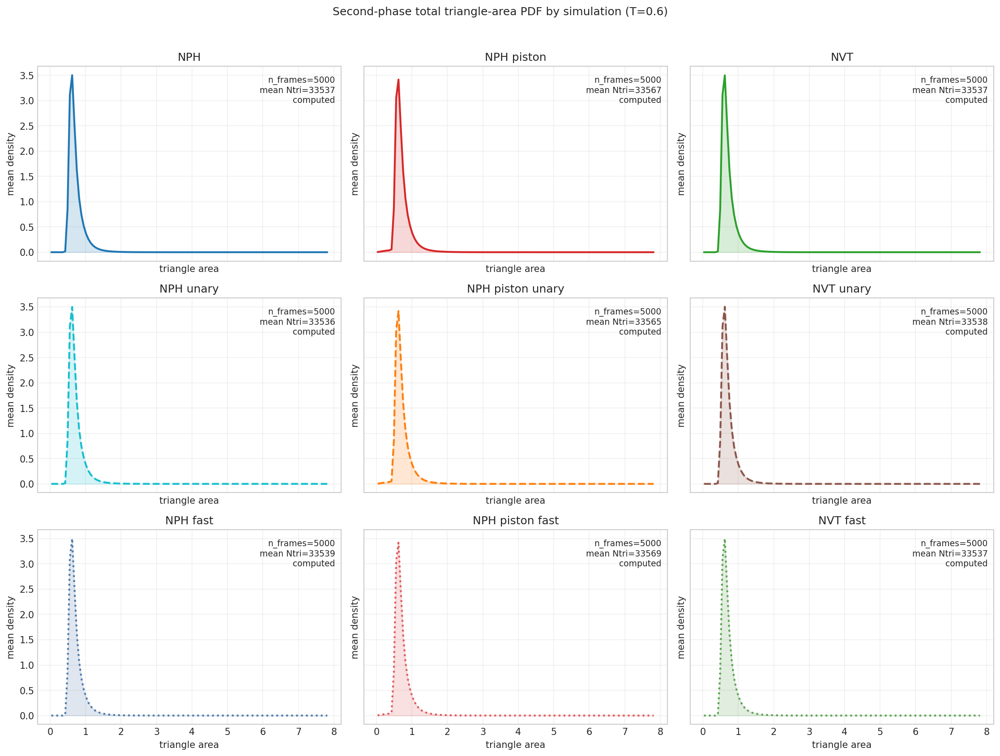

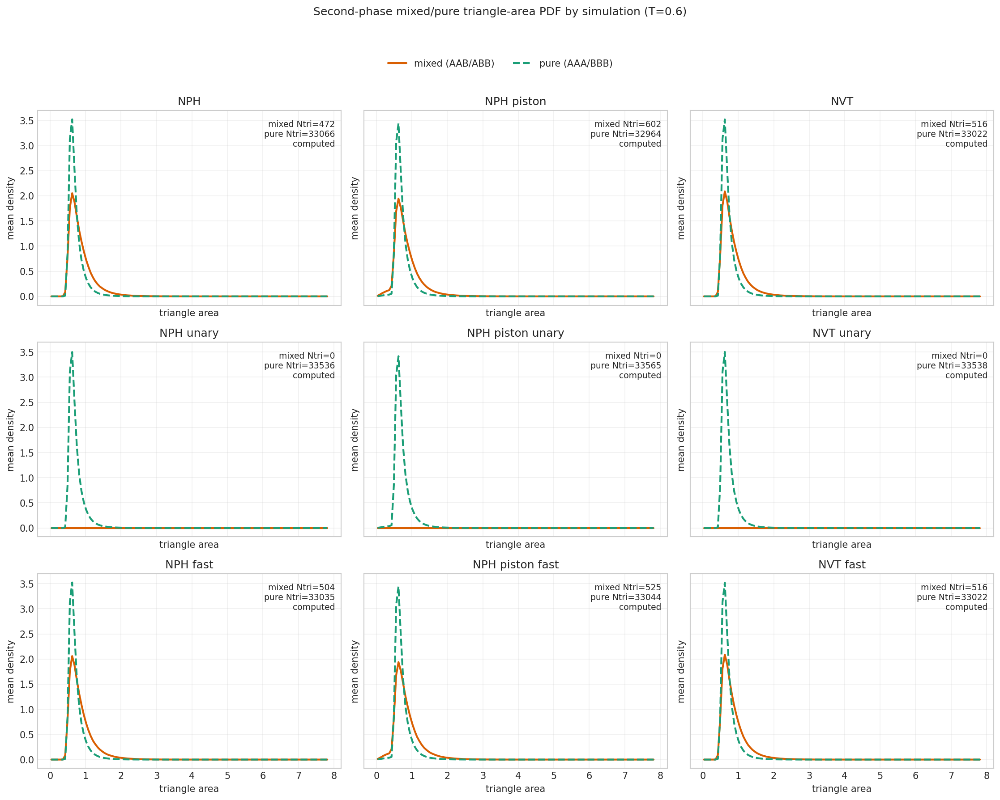

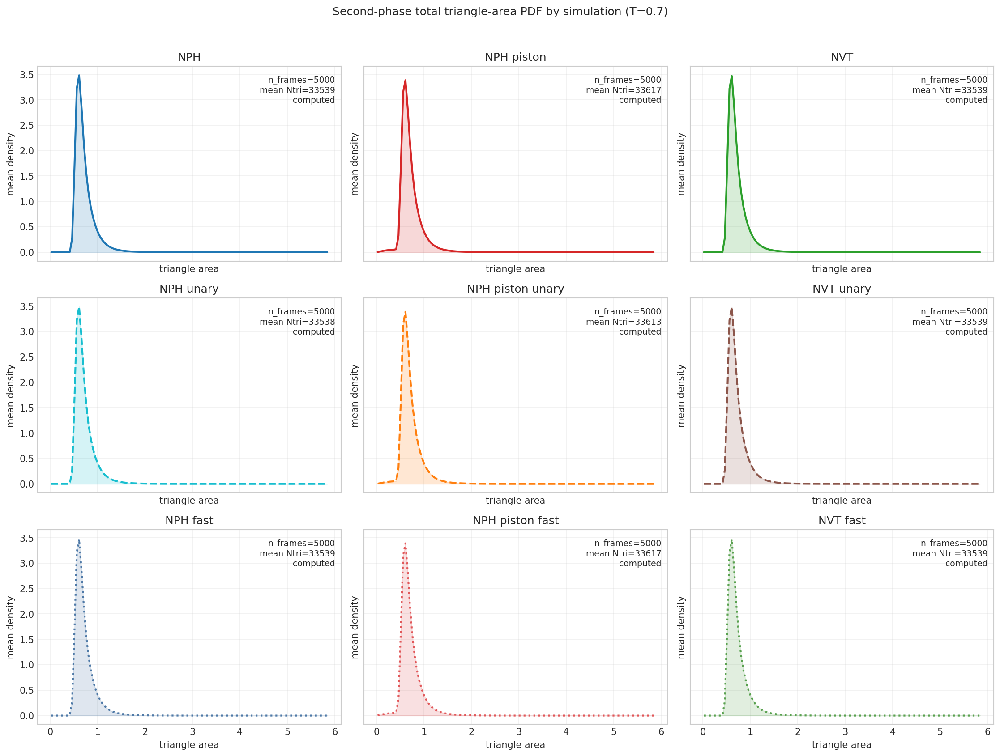

...

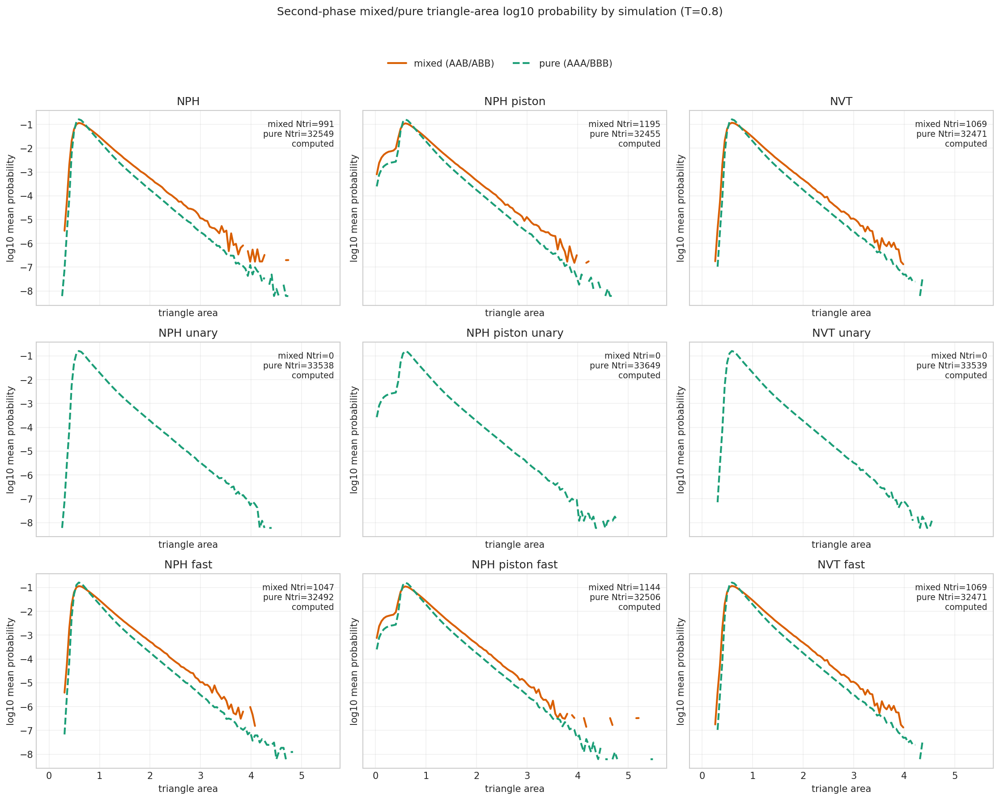

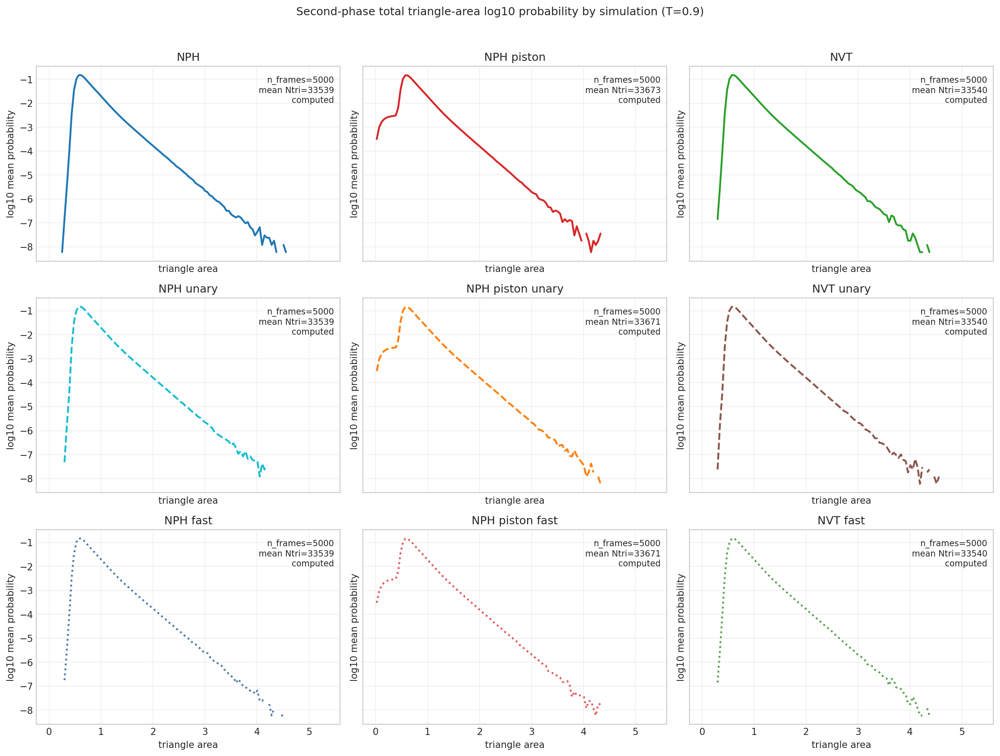

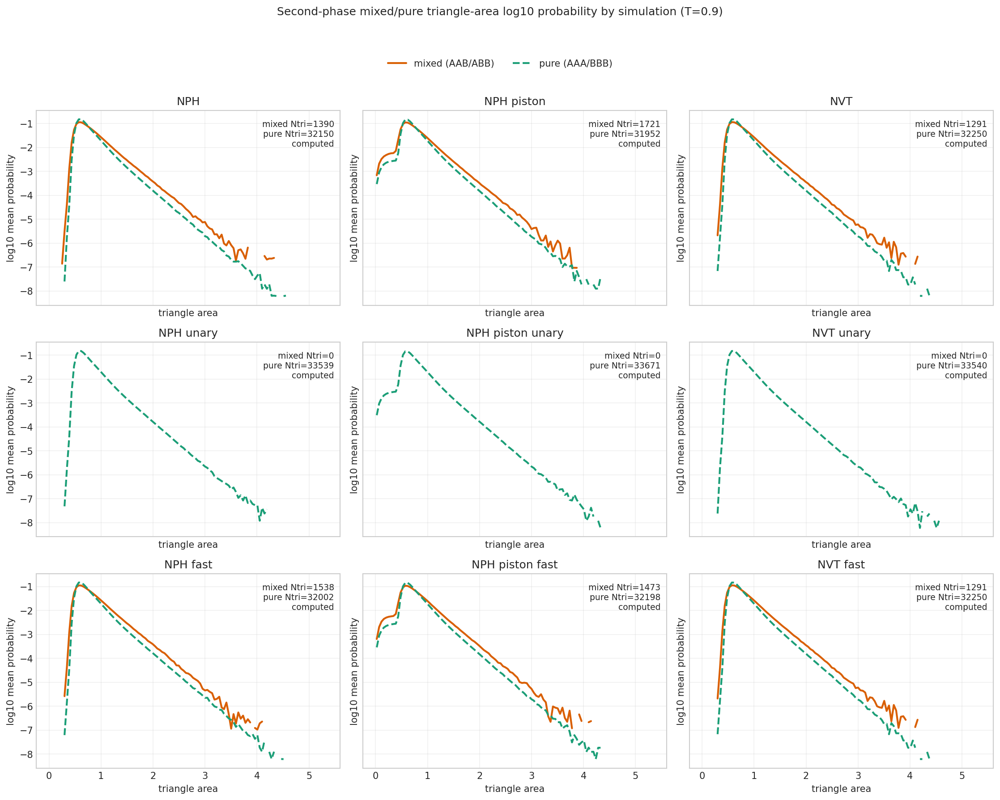

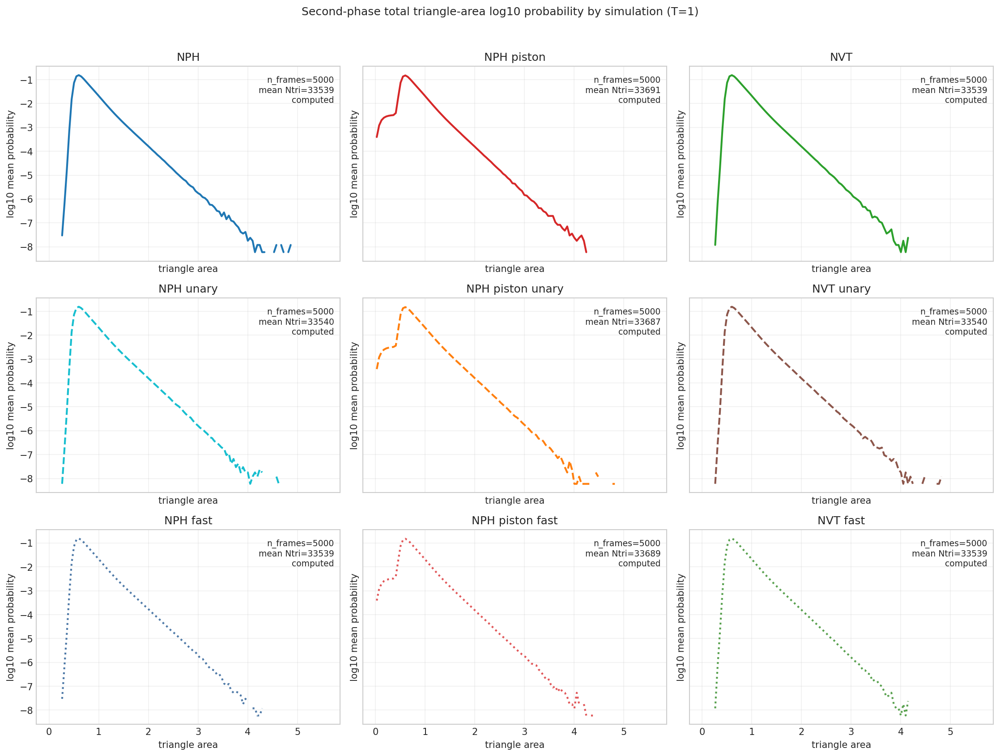

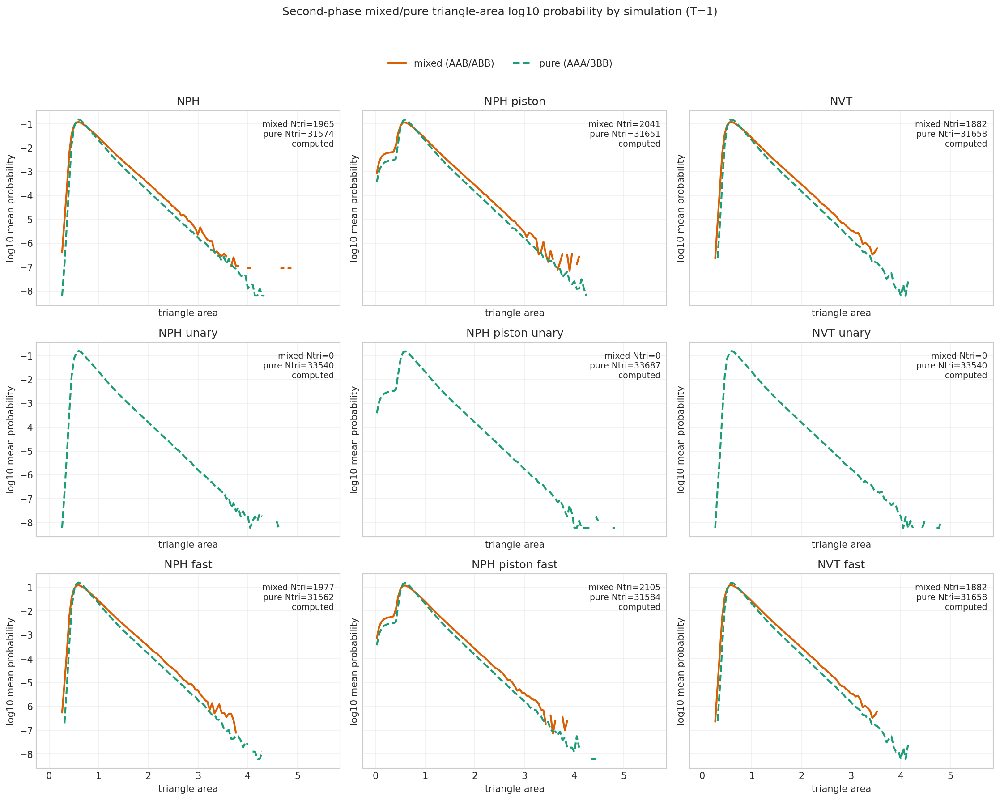

Saved separated histogram plots:
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_separate_T_0p5.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_by_type_separate_pdf_T_0p5.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_separate_T_0p6.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_by_type_separate_pdf_T_0p6.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_separate_T_0p7.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_by_type_separate_pdf_T_0p7.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_separate_T_0p8.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_area_histograms_by_type_separate_pdf_T_0p8.svg
 - results/analysis_NPH_20260324_triangle_area/plots_separate/triangle_

In [11]:

saved_separate_paths: list[Path] = []

for metric_id in PLOT_METRIC_IDS:
    for temp_value, result in analysis_by_temp.items():
        saved_separate_paths.append(plot_total_histograms_by_simulation(temp_value, result, metric_id))
        saved_separate_paths.append(plot_type_histograms_by_simulation(temp_value, result, metric_id))

print("Saved separated histogram plots:")
for path in saved_separate_paths:
    print(" -", path.relative_to(REPO_ROOT))


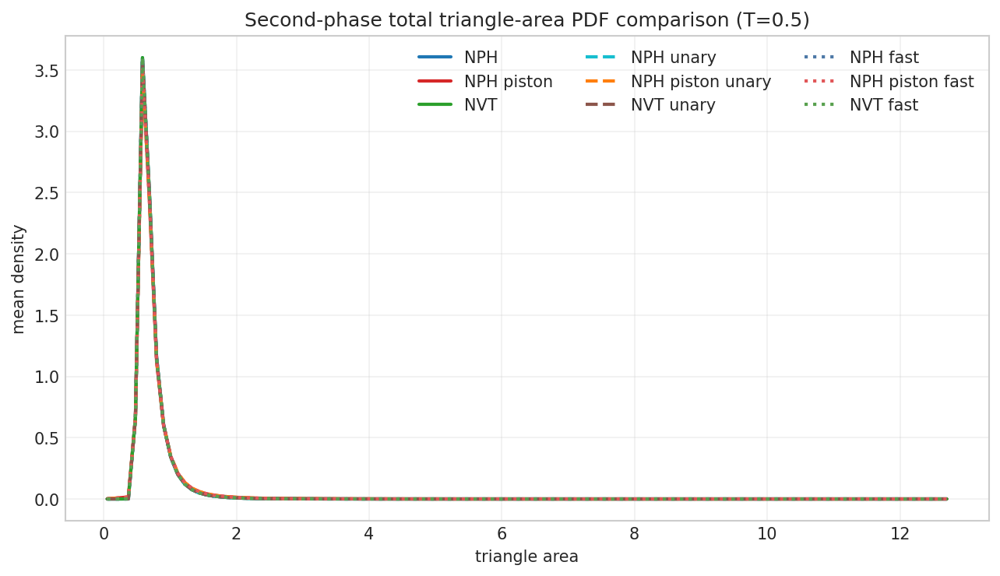

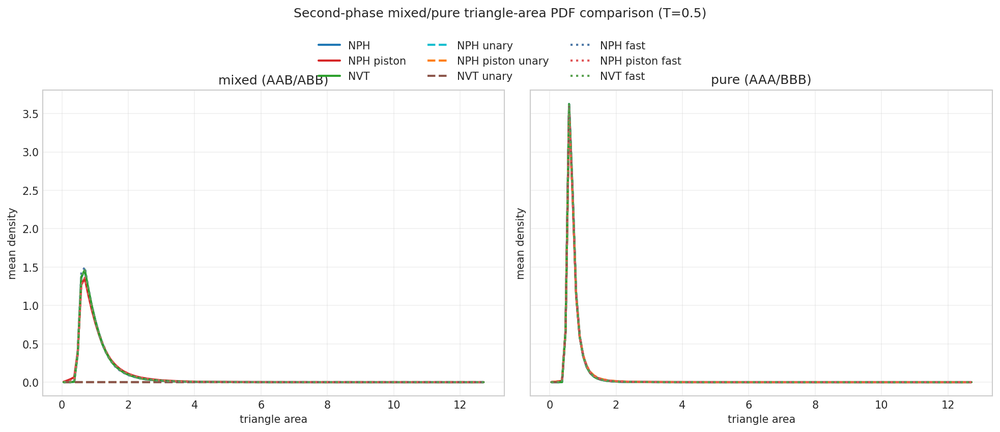

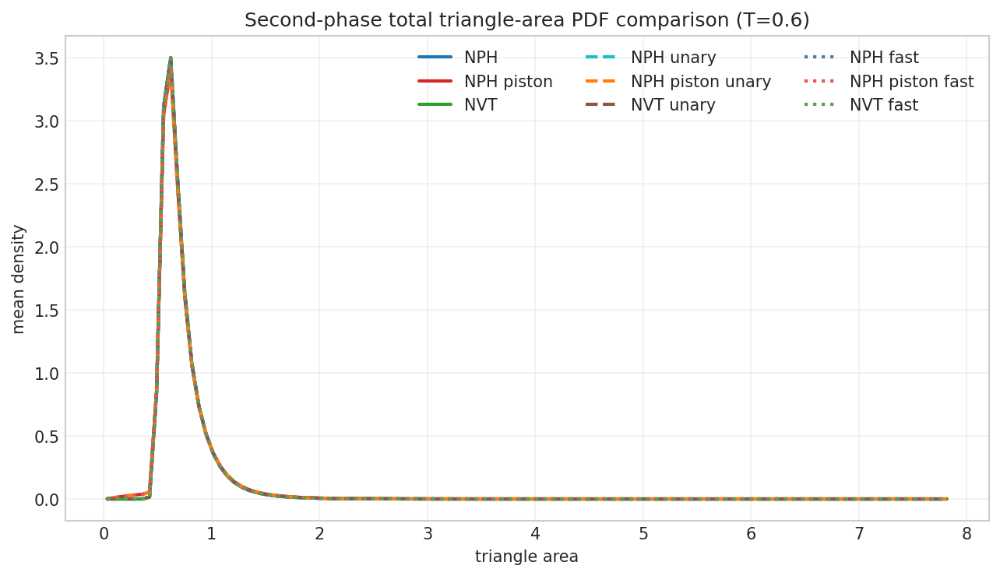

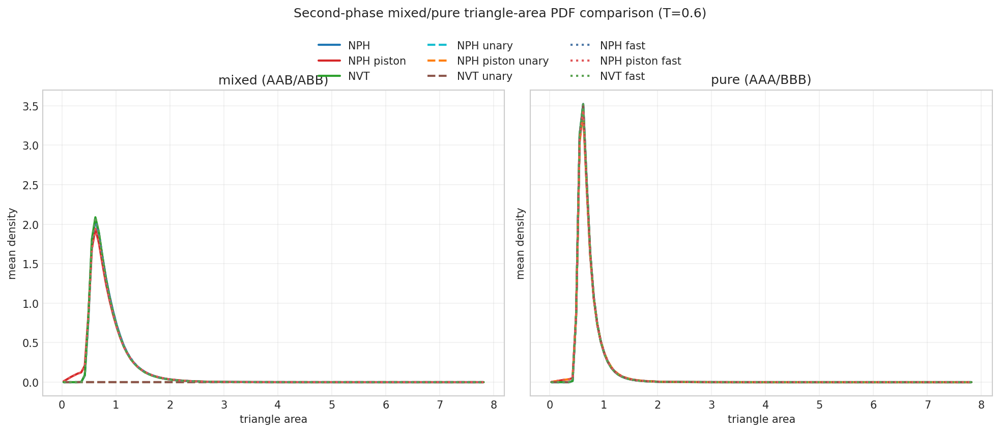

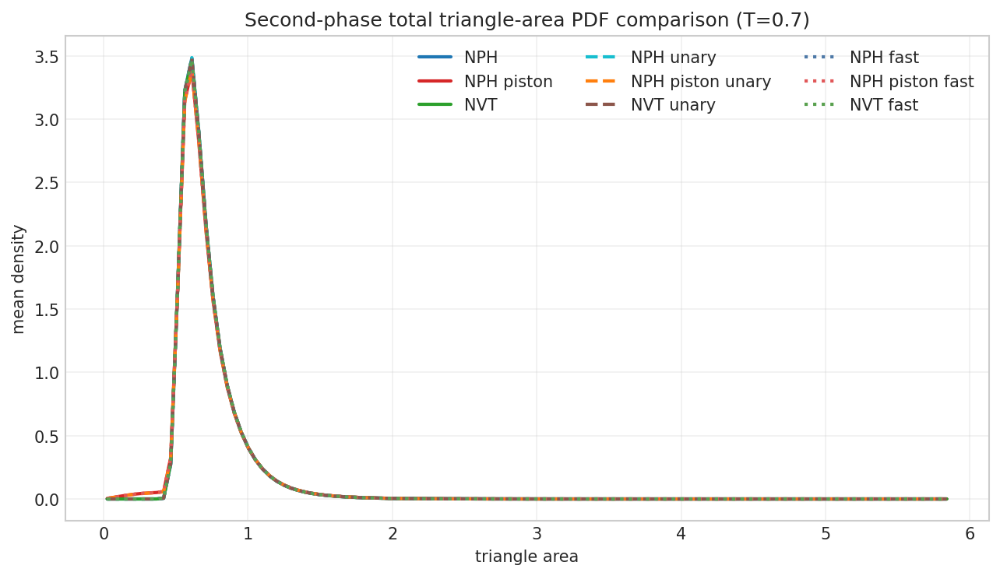

...

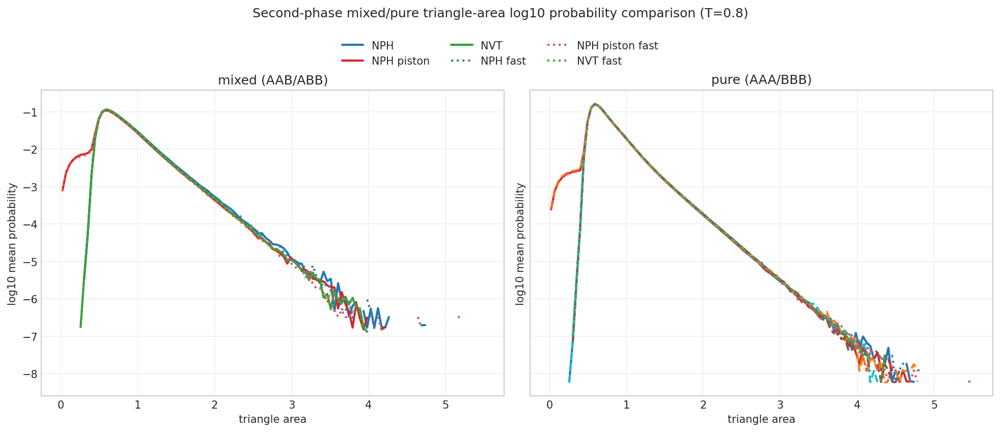

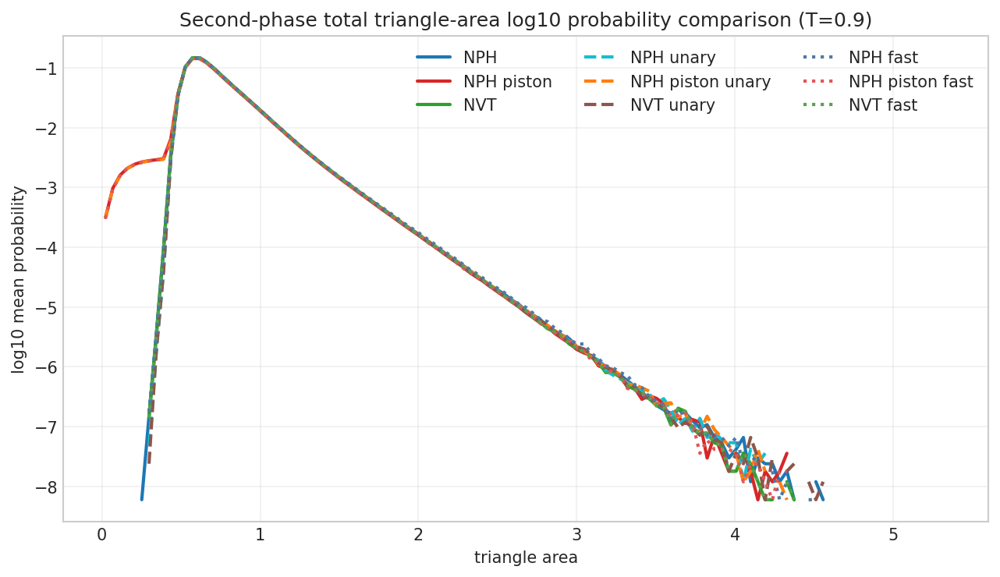

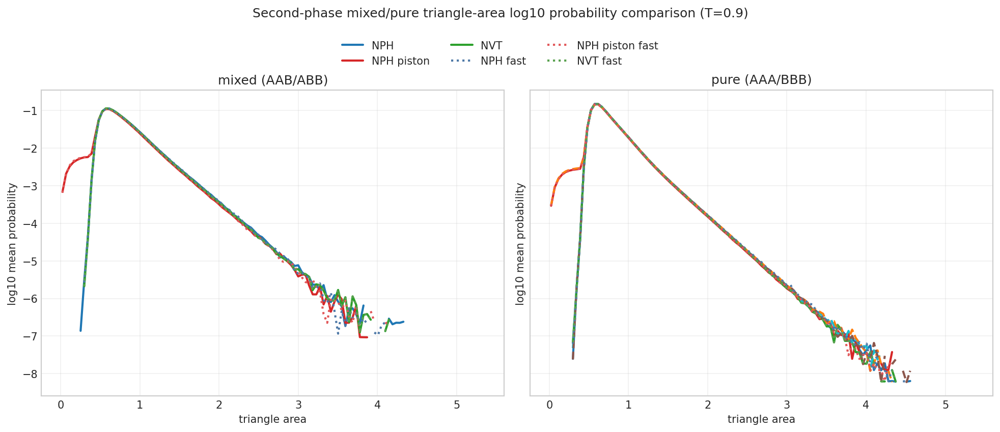

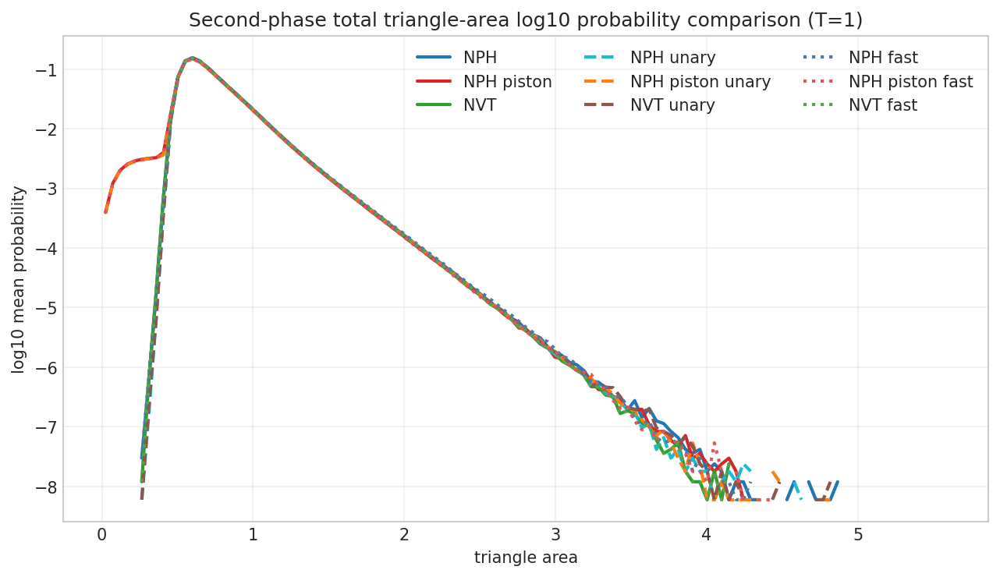

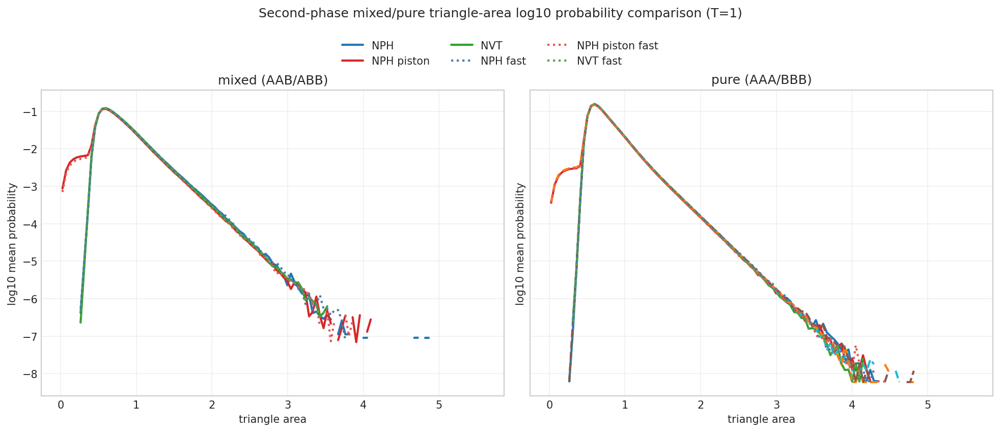

Saved overlay histogram plots:
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_overlay_T_0p5.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_by_type_overlay_pdf_T_0p5.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_overlay_T_0p6.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_by_type_overlay_pdf_T_0p6.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_overlay_T_0p7.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_by_type_overlay_pdf_T_0p7.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_overlay_T_0p8.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_by_type_overlay_pdf_T_0p8.svg
 - results/analysis_NPH_20260324_triangle_area/plots_overlay/triangle_area_histograms_ove

In [12]:

saved_overlay_paths: list[Path] = []

for metric_id in PLOT_METRIC_IDS:
    for temp_value, result in analysis_by_temp.items():
        total_path = plot_total_histograms_overlay(temp_value, result, metric_id)
        if total_path is not None:
            saved_overlay_paths.append(total_path)

        type_path = plot_type_histograms_overlay(temp_value, result, metric_id)
        if type_path is not None:
            saved_overlay_paths.append(type_path)

print("Saved overlay histogram plots:")
for path in saved_overlay_paths:
    print(" -", path.relative_to(REPO_ROOT))
